In [2]:
pip install pandas


  Using cached pandas-1.5.3-cp311-cp311-win_amd64.whl (10.3 MB)
  Using cached pytz-2022.7.1-py2.py3-none-any.whl (499 kB)
  Using cached numpy-1.24.2-cp311-cp311-win_amd64.whl (14.8 MB)
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install -U scikit-learn

     ---------------------------------------- 0.0/8.3 MB ? eta -:--:--
     ---------------------------------------- 0.1/8.3 MB 1.7 MB/s eta 0:00:05
      --------------------------------------- 0.2/8.3 MB 2.4 MB/s eta 0:00:04
     - -------------------------------------- 0.3/8.3 MB 2.2 MB/s eta 0:00:04
     -- ------------------------------------- 0.5/8.3 MB 2.8 MB/s eta 0:00:03
     --- ------------------------------------ 0.7/8.3 MB 3.4 MB/s eta 0:00:03
     ---- ----------------------------------- 1.0/8.3 MB 3.9 MB/s eta 0:00:02
     ------ --------------------------------- 1.3/8.3 MB 4.1 MB/s eta 0:00:02
     ------- -------------------------------- 1.5/8.3 MB 4.4 MB/s eta 0:00:02
     -------- ------------------------------- 1.7/8.3 MB 4.3 MB/s eta 0:00:02
     --------- ------------------------------ 2.0/8.3 MB 4.3 MB/s eta 0:00:02
     ---------- ----------------------------- 2.2/8.3 MB 4.4 MB/s eta 0:00:02
     ----------- ---------------------------- 2.4/8.3 MB 4.4 MB/s eta 0

In [4]:
pip install seaborn


  Using cached seaborn-0.12.2-py3-none-any.whl (293 kB)
     ---------------------------------------- 0.0/7.6 MB ? eta -:--:--
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
     ---------------------------------------- 0.1/7.6 MB 2.6 MB/s eta 0:00:03
      --------------------------------------- 0.1/7.6 MB 251.6 kB/s eta 0:00:30
      --------------------------------------- 0.1/7.6 MB 251.6 kB/s eta 0:00:30
      -----

In [6]:
pip install -U matplotlib

Note: you may need to restart the kernel to use updated packages.


In [7]:
import pandas as pd
from sklearn.metrics import v_measure_score
from sklearn.metrics import adjusted_mutual_info_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns 

In [8]:
bmi_data = pd.read_csv('BMI.csv') 

In [9]:
bmi_data.head() # display the first 5 rows

,age,height,weight,bmi,class_
0,18,1.70,130.51,45.39,obese
1,71,1.70,69.30,24.04,normal
2,31,1.97,141.19,36.45,obese
3,52,2.07,146.50,34.08,obese
4,45,1.76,69.05,22.18,normal


In [11]:
bmi_data.isna().sum() # check for missing value

age       0
height    0
weight    0
bmi       0
class_    0
dtype: int64

In [12]:
bmi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     20000 non-null  int64  
 1   height  20000 non-null  float64
 2   weight  20000 non-null  float64
 3   bmi     20000 non-null  float64
 4   class_  20000 non-null  object 
dtypes: float64(3), int64(1), object(1)
memory usage: 781.4+ KB


In [13]:
#bmi_data_num=bmi_data.select_dtypes(exclude = 'object')
#get my data
bmi_data_num = bmi_data[['height', 'bmi']]

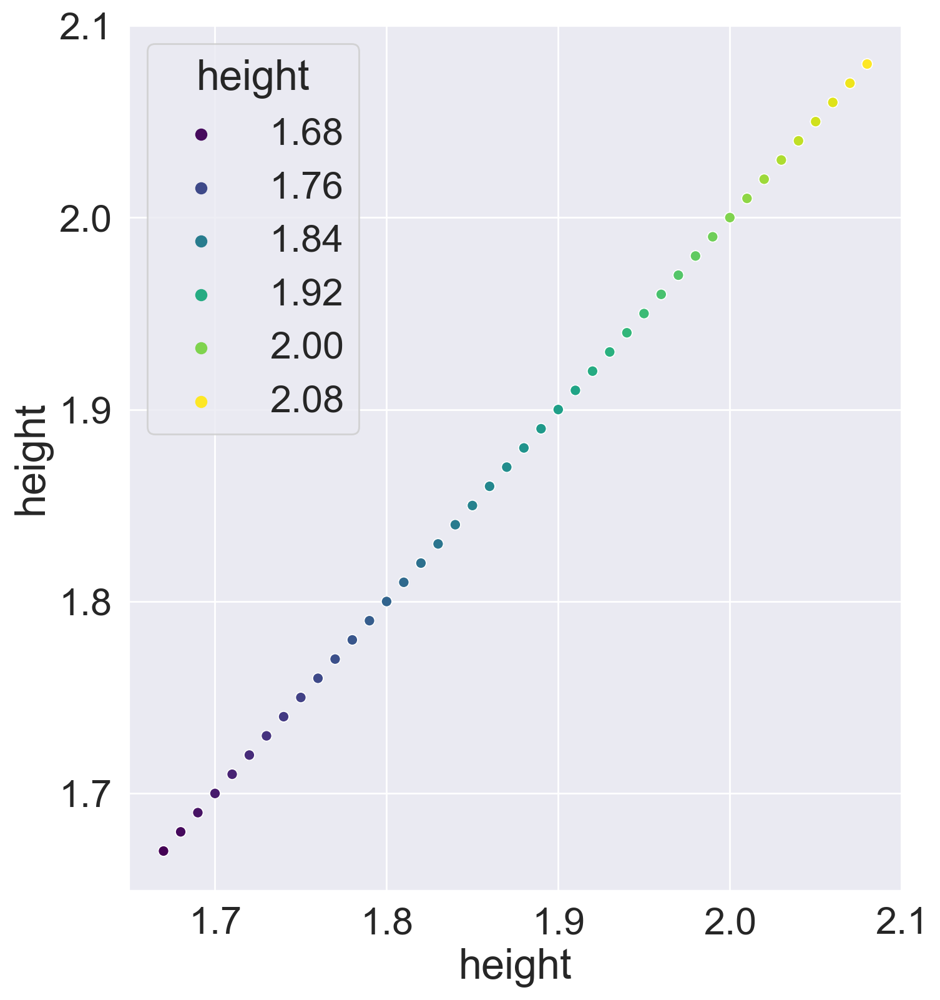

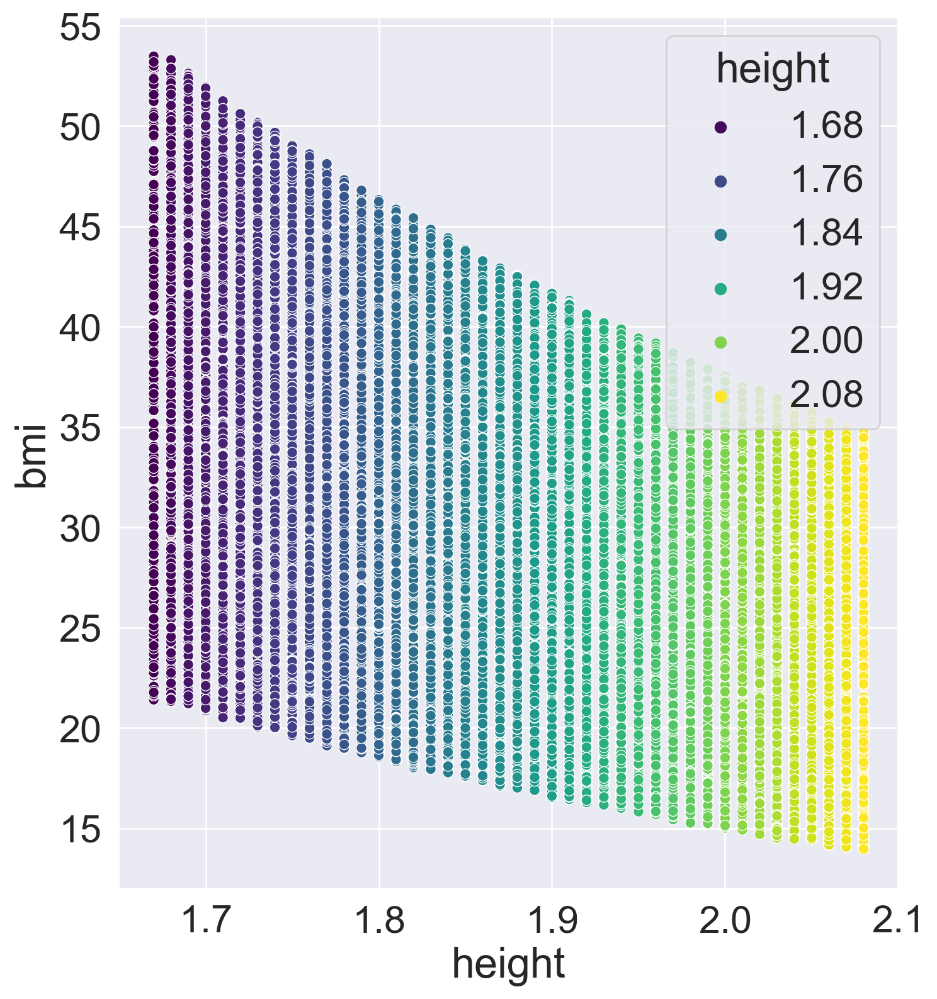

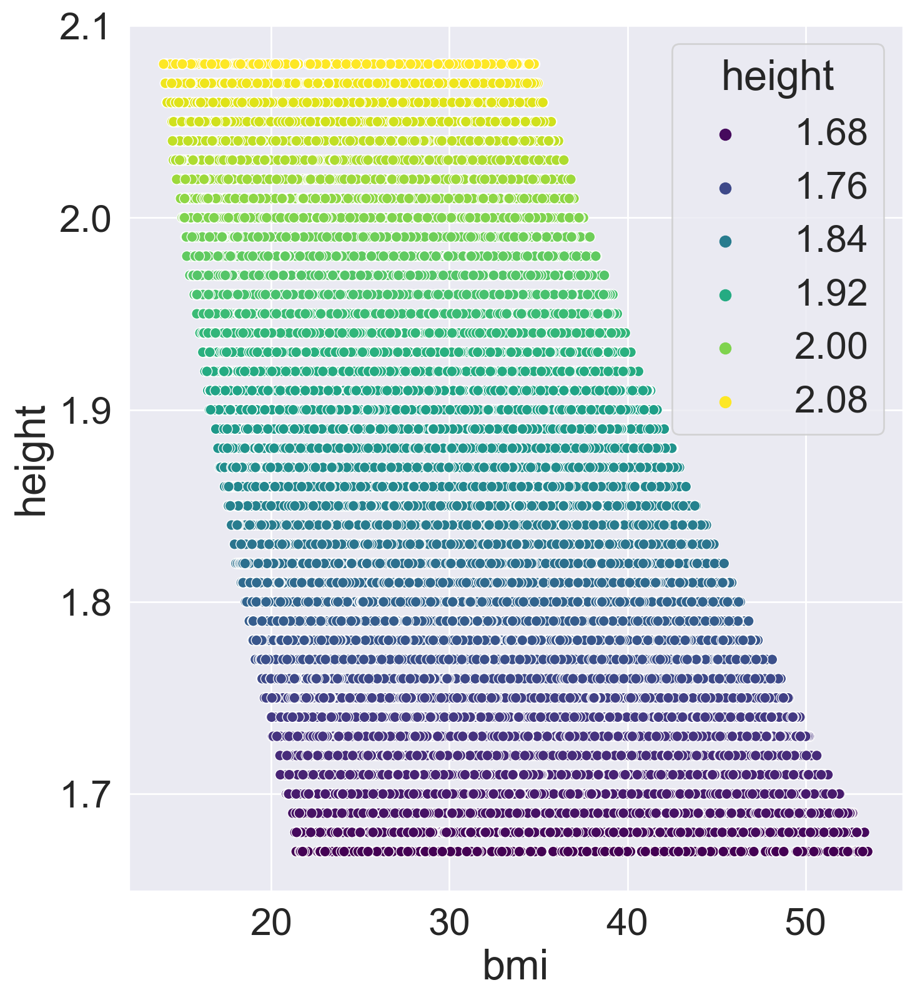

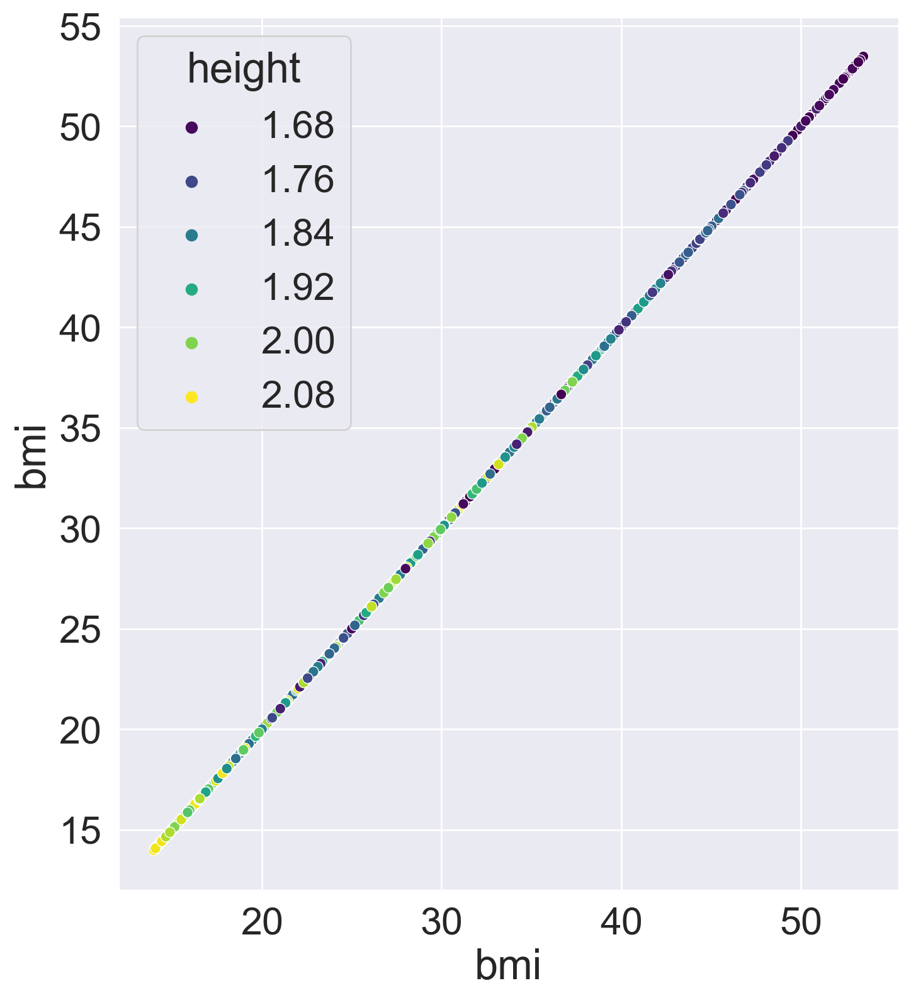

In [14]:
for col1 in bmi_data_num.columns:
 for col2 in bmi_data_num.columns:
     plt.figure(figsize = (8,9),dpi = 200)
     sns.set(font_scale=2)
     sns.scatterplot(data = bmi_data_num, x = bmi_data_num[col1],y = bmi_data_num[col2],
     hue='height', palette = 'viridis')
     plt.show()

In [15]:
from sklearn.preprocessing import StandardScaler

In [16]:
scaler = StandardScaler() # instantiate an object of the StandardScaler() class 

In [17]:
scaled_bmi_data_num=scaler.fit_transform(bmi_data_num)
scaled_bmi_data_num

array([[-1.47563078,  1.78880809],
       [-1.47563078, -0.72898957],
       [ 0.79825009,  0.73451717],
       ...,
       [ 0.37716104, -0.52143342],
       [-0.04392801, -1.43656737],
       [ 1.38777476, -0.48605453]])

In [21]:
from sklearn.cluster import KMeans 
import warnings
warnings.filterwarnings('ignore')

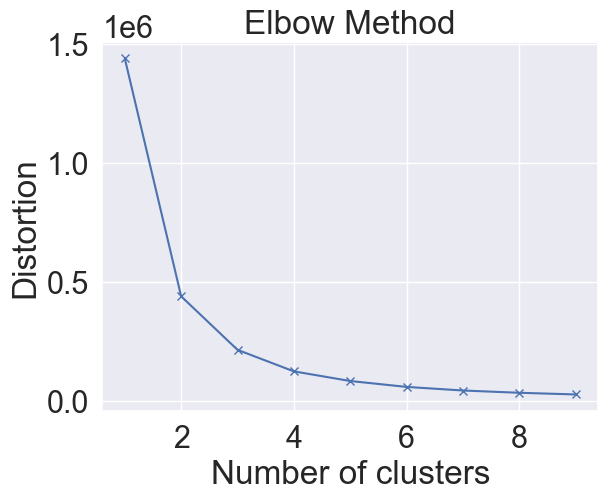

In [24]:
distortions = []
K = range(1, 10)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(bmi_data_num)
    distortions.append(kmeans.inertia_)
plt.plot(K, distortions, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [25]:
kmeans = KMeans(n_clusters=3, random_state=42)
C_labels = kmeans.fit_predict(scaled_bmi_data_num)

In [26]:
C_labels

array([1, 2, 0, ..., 0, 2, 0])

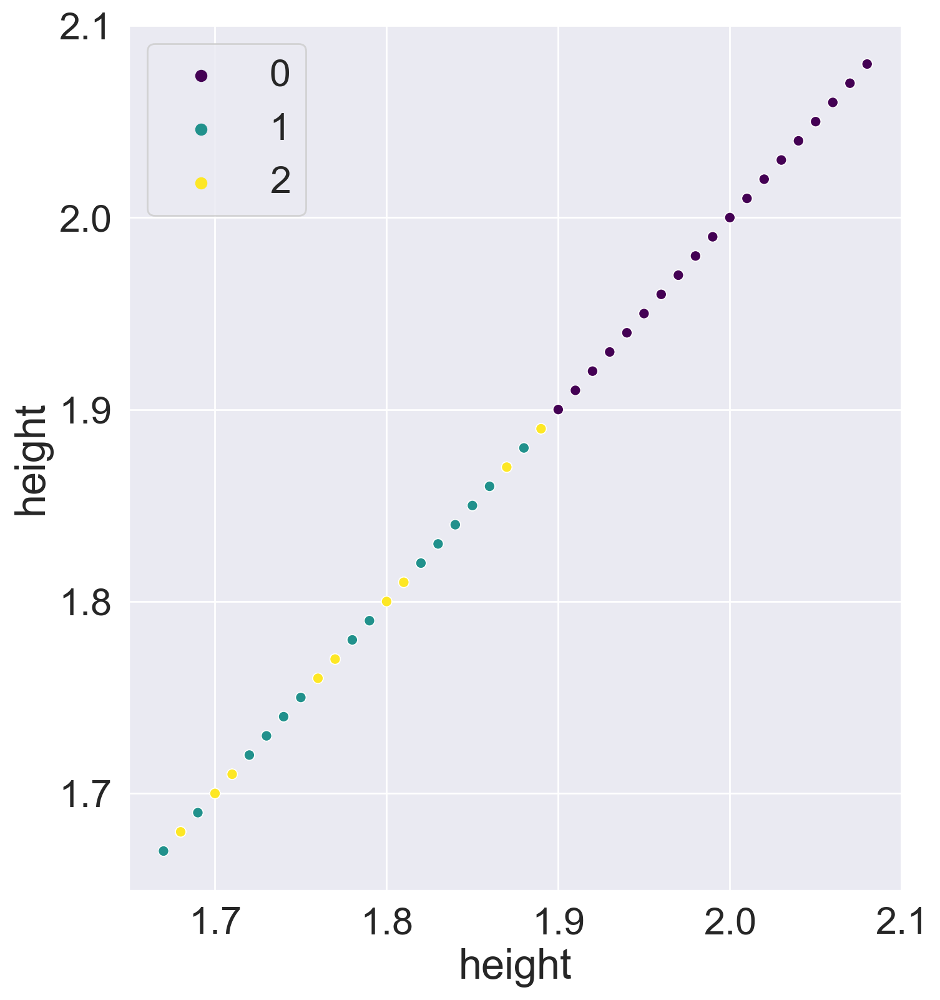

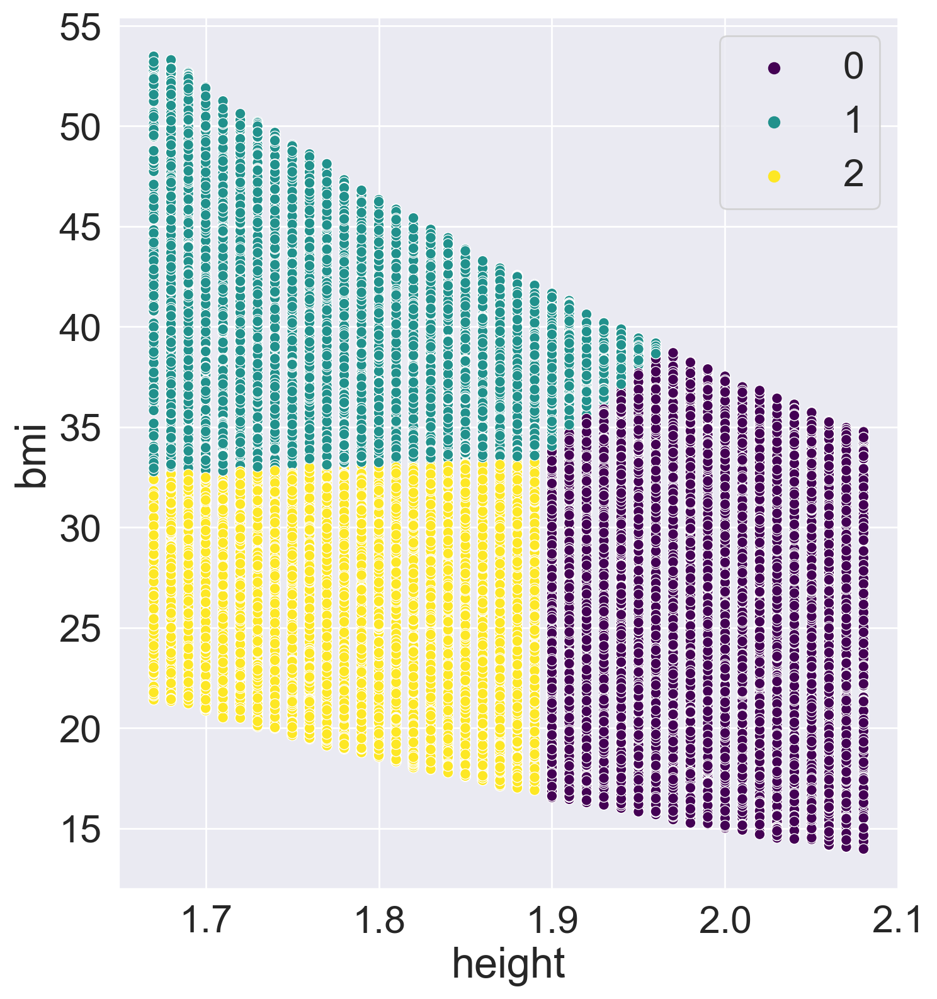

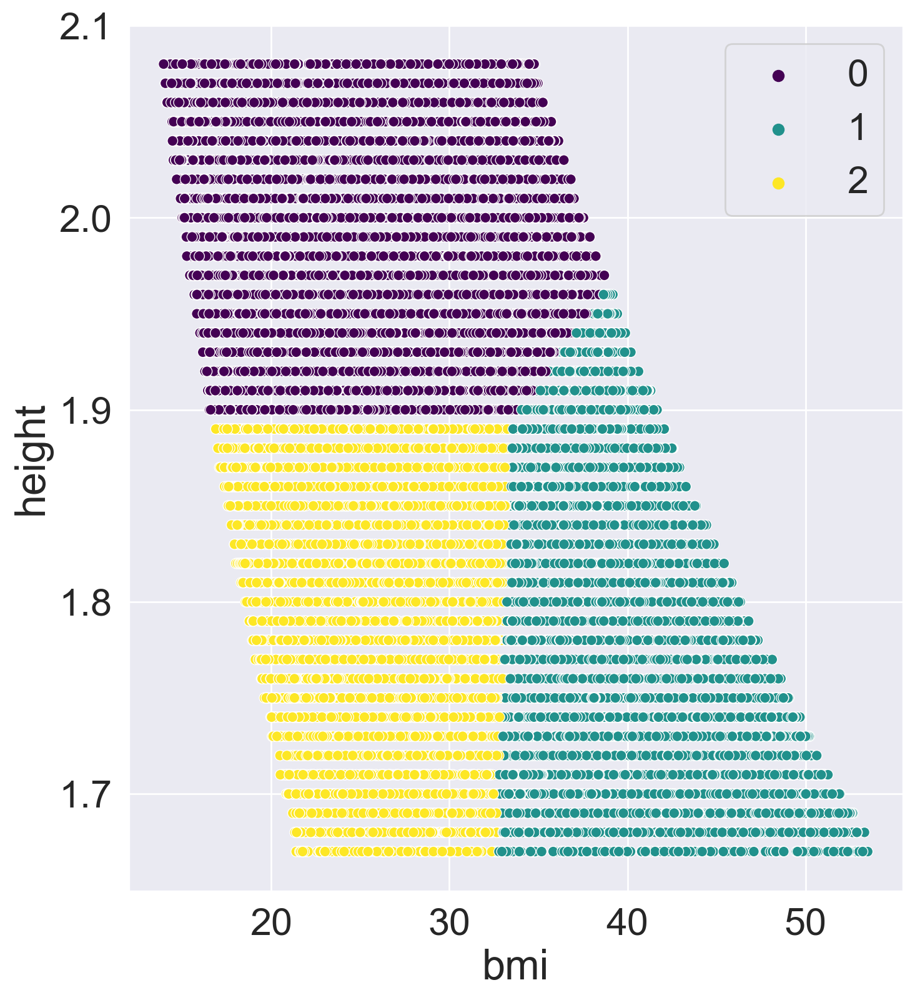

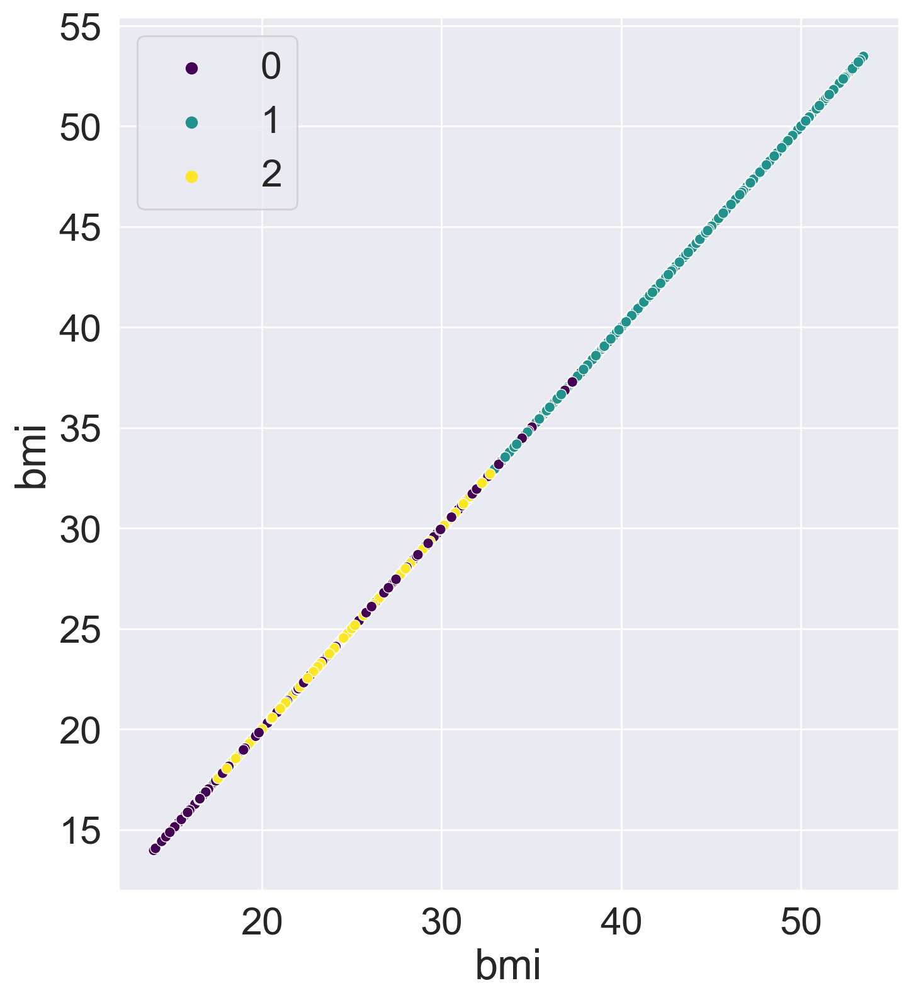

In [27]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in bmi_data_num.columns:
 for col2 in bmi_data_num.columns:
     plt.figure(figsize = (8,9),dpi = 200)
     sns.set(font_scale=2)
     sns.scatterplot(data = bmi_data_num, x = bmi_data_num[col1], y = bmi_data_num[col2],
     hue=C_labels, palette = 'viridis')
     plt.show()

In [29]:
# intrinsic metrics
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score
## extrinsic metrics
from sklearn.metrics import adjusted_rand_score, v_measure_score, adjusted_mutual_info_score
# Get the true class labels
y_true = bmi_data['class_']

In [30]:
# Calculate the v-measure score
v_measure = v_measure_score(y_true, C_labels)
print(f'External Evaluation Measures')
print(f'********************************')
print(f'V-measure Score: {v_measure:.3f}')
# Calculate the Rand index score
rand_index = adjusted_rand_score(y_true, C_labels)
print(f'Rand Index Score: {rand_index:.3f}')
# Calculate the mutual information score
mi_score = adjusted_mutual_info_score(y_true, C_labels)
print(f'Mutual Information Score: {mi_score:.3f}\n')
# Calculate the Davies-Bouldin index
db_score = davies_bouldin_score(scaled_bmi_data_num, C_labels)
print(f'Internal Evaluation Measures')
print(f'********************************')
print(f'Davies-Bouldin Index: {db_score:.3f}')
# Calculate the Silhouette coefficient
s_score = silhouette_score(scaled_bmi_data_num, C_labels)
print(f'Silhouette Coefficient: {s_score:.3f}')
c_score = calinski_harabasz_score(scaled_bmi_data_num, C_labels)
print(f'Calinski Harabasz Score: {c_score:.3f}')

External Evaluation Measures
********************************
V-measure Score: 0.267
Rand Index Score: 0.195
Mutual Information Score: 0.267

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.874
Silhouette Coefficient: 0.401
Calinski Harabasz Score: 19800.163


In [37]:
kmeans = KMeans(n_clusters=20, random_state=42)
C_labels = kmeans.fit_predict(scaled_bmi_data_num)

In [38]:
C_labels

array([ 5, 12,  8, ...,  2,  1, 18])

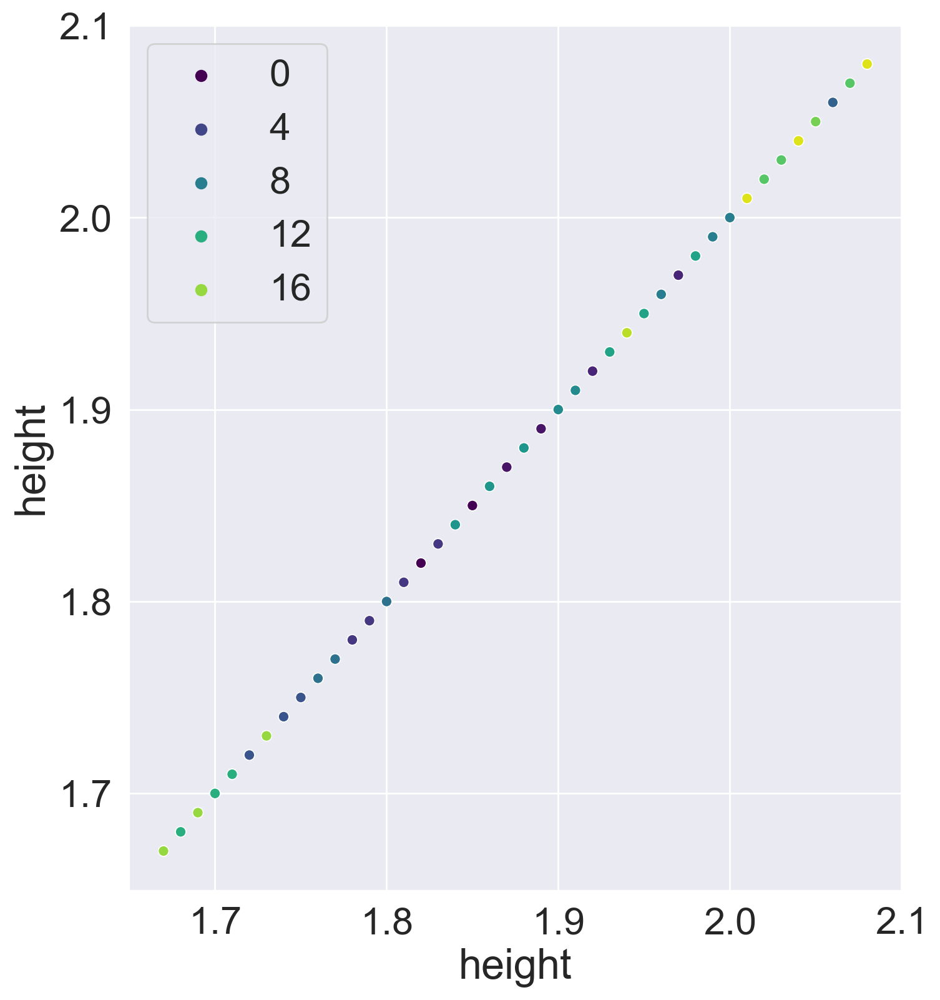

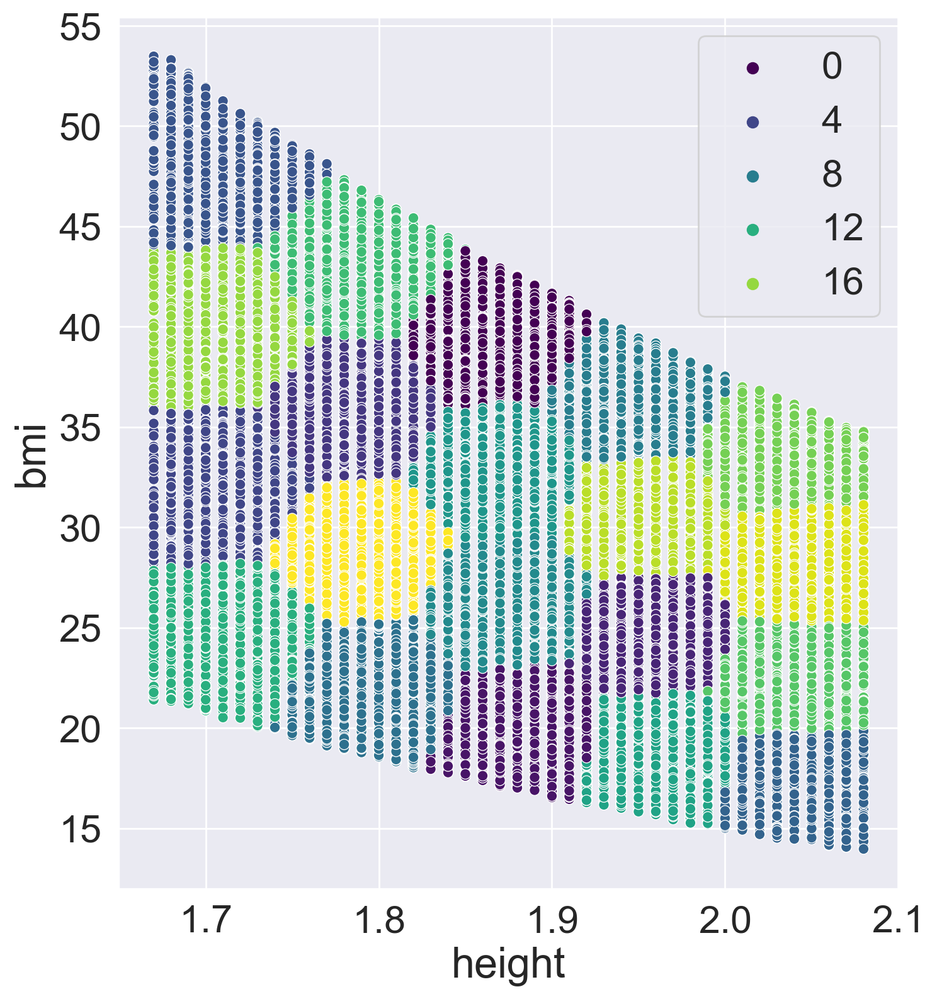

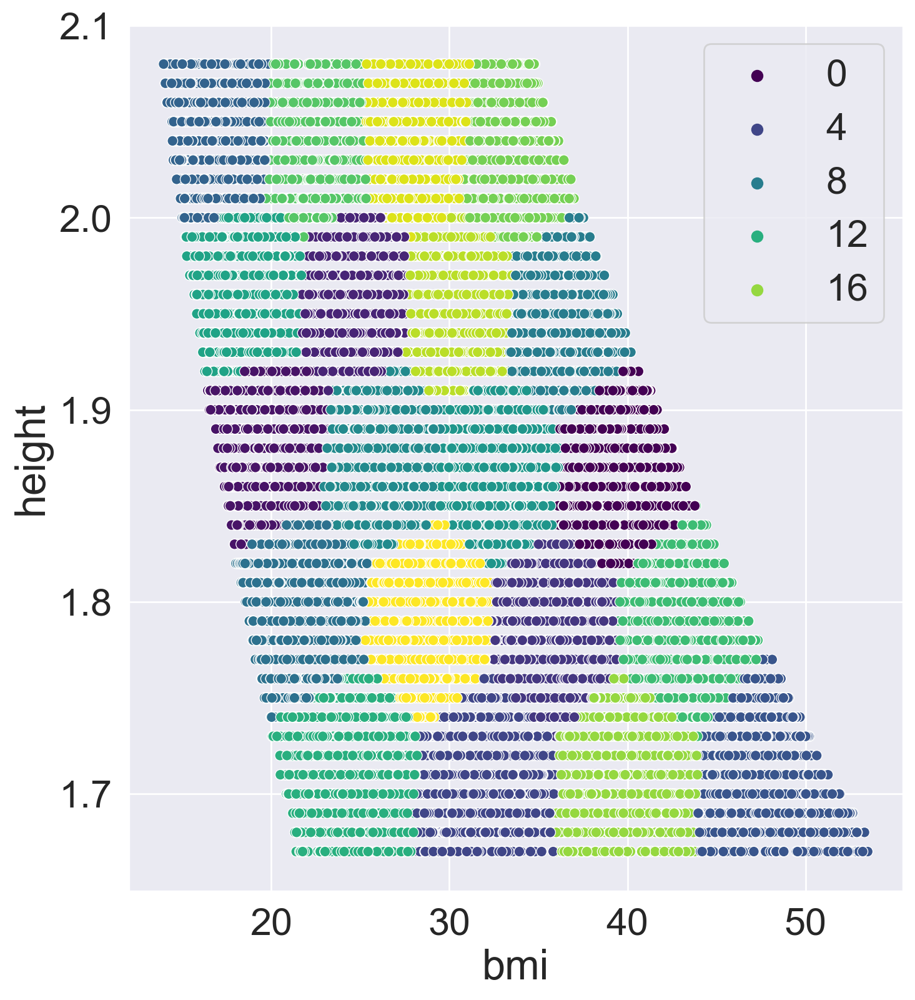

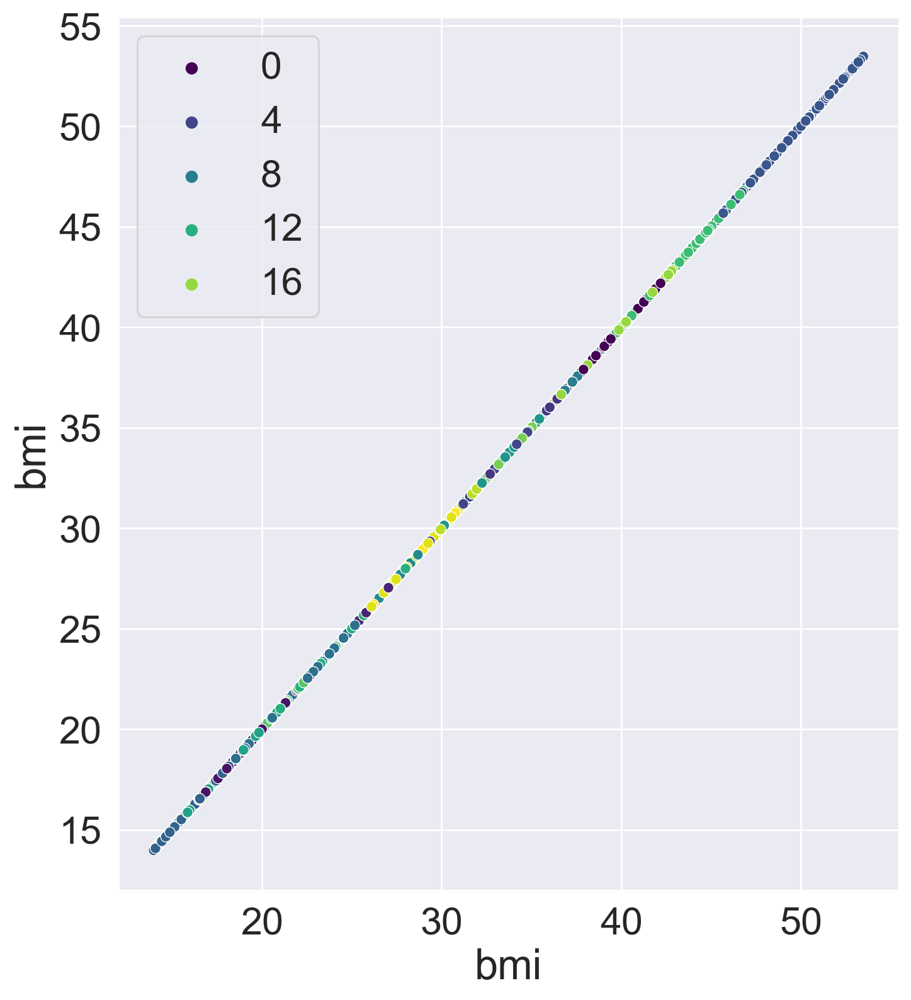

In [39]:
# plotting the attributes to see how they affect the clusters formed 
for col1 in bmi_data_num.columns:
 for col2 in bmi_data_num.columns:
     plt.figure(figsize = (8,9),dpi = 200)
     sns.set(font_scale=2)
     sns.scatterplot(data = bmi_data_num, x = bmi_data_num[col1], y = bmi_data_num[col2],
     hue=C_labels, palette = 'viridis')
     plt.show()

In [40]:
# intrinsic metrics
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score
## extrinsic metrics
from sklearn.metrics import adjusted_rand_score, v_measure_score, adjusted_mutual_info_score
# Get the true class labels
y_true = bmi_data['class_']

In [42]:
# Calculate the v-measure score
v_measure = v_measure_score(y_true, C_labels)
print(f'External Evaluation Measures')
print(f'********************************')
print(f'V-measure Score: {v_measure:.3f}')
# Calculate the Rand index score
rand_index = adjusted_rand_score(y_true, C_labels)
print(f'Rand Index Score: {rand_index:.3f}')
# Calculate the mutual information score
mi_score = adjusted_mutual_info_score(y_true, C_labels)
print(f'Mutual Information Score: {mi_score:.3f}\n')
# Calculate the Davies-Bouldin index
db_score = davies_bouldin_score(scaled_bmi_data_num, C_labels)
print(f'Internal Evaluation Measures')
print(f'********************************')
print(f'Davies-Bouldin Index: {db_score:.3f}')
# Calculate the Silhouette coefficient
s_score = silhouette_score(scaled_bmi_data_num, C_labels)
print(f'Silhouette Coefficient: {s_score:.3f}')
c_score = calinski_harabasz_score(scaled_bmi_data_num, C_labels)
print(f'Calinski Harabasz Score: {c_score:.3f}')

External Evaluation Measures
********************************
V-measure Score: 0.409
Rand Index Score: 0.123
Mutual Information Score: 0.409

Internal Evaluation Measures
********************************
Davies-Bouldin Index: 0.759
Silhouette Coefficient: 0.358
Calinski Harabasz Score: 23000.991


In [43]:
from sklearn.preprocessing import MinMaxScaler

In [44]:
from sklearn.cluster import AgglomerativeClustering

In [45]:
agg_model = AgglomerativeClustering(n_clusters=3,linkage='single')

In [46]:
agg_labels=agg_model.fit_predict(scaled_bmi_data_num)
agg_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [47]:
DBI=davies_bouldin_score(scaled_bmi_data_num,agg_labels)
DBI

6.652870263887522

In [48]:
sil_score=silhouette_score(scaled_bmi_data_num,agg_labels)
sil_score

0.11549053076521307

In [49]:
agg_model = AgglomerativeClustering(n_clusters=None, distance_threshold=0

In [50]:
agg_label=agg_model.fit_predict(scaled_bmi_data_num)
agg_label

array([17259, 14901, 18105, ...,     5,     2,     0], dtype=int64)

In [51]:
# scipy is used for plotting the hierarchy
from scipy.cluster import hierarchy 
from scipy.cluster.hierarchy import dendrogram

In [52]:
matrix_linkage = hierarchy.linkage(agg_model.children_) # hierarchy is used to obtain th
matrix_linkage # distances between the points 

array([[2.16800000e+03, 5.74800000e+03, 1.41421356e+00, 2.00000000e+00],
       [4.16100000e+03, 1.15850000e+04, 1.41421356e+00, 2.00000000e+00],
       [3.97300000e+03, 6.07100000e+03, 1.41421356e+00, 2.00000000e+00],
       ...,
       [1.71420000e+04, 3.99930000e+04, 1.46023149e+03, 1.99970000e+04],
       [1.75990000e+04, 3.99940000e+04, 1.90473305e+03, 1.99980000e+04],
       [1.79510000e+04, 3.99950000e+04, 2.68744712e+03, 1.99990000e+04]])

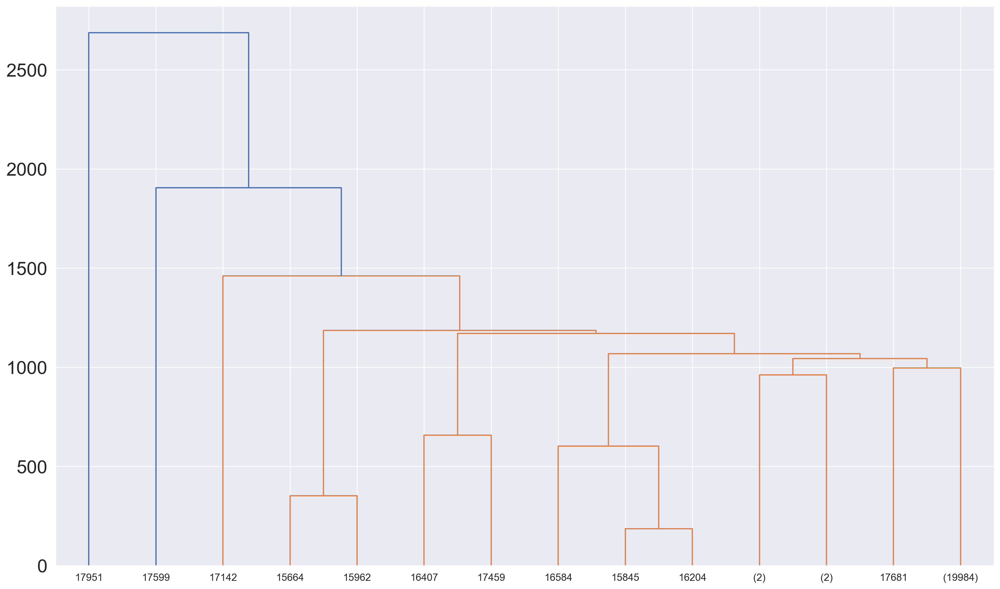

In [53]:
plt.figure(figsize=(20,12), dpi = 200,)
dendrogram(Z=matrix_linkage,truncate_mode= 'level', p= 7);